<a href="https://colab.research.google.com/github/LaboneeyDhanure/Retail_sales_analysis/blob/main/retail_sales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import calmap
from ydata_profiling import ProfileReport

In [ ]:
df = pd.read_csv(r'F:\Personal_Notes\power_BI\supermarket\sale.csv')
df.head()

,Invoice ID,Branch,City,Customer type,Gender,Product line,Unit price,Quantity,Tax 5%,Total,Date,Time,Payment,cogs,gross margin percentage,gross income,Rating
0,750-67-8428,A,Yangon,Member,Female,Health and beauty,74.69,7,26.1415,548.9715,1/5/2019,13:08,Ewallet,522.83,4.761905,26.1415,9.1
1,226-31-3081,C,Naypyitaw,Normal,Female,Electronic accessories,15.28,5,3.8200,80.2200,3/8/2019,10:29,Cash,76.40,4.761905,3.8200,9.6
2,631-41-3108,A,Yangon,Normal,Male,Home and lifestyle,46.33,7,16.2155,340.5255,3/3/2019,13:23,Credit card,324.31,4.761905,16.2155,7.4
3,123-19-1176,A,Yangon,Member,Male,Health and beauty,58.22,8,23.2880,489.0480,1/27/2019,20:33,Ewallet,465.76,4.761905,23.2880,8.4
4,373-73-7910,A,Yangon,Normal,Male,Sports and travel,86.31,7,30.2085,634.3785,2/8/2019,10:37,Ewallet,604.17,4.761905,30.2085,5.3


In [ ]:
df.columns

Index(['Invoice ID', 'Branch', 'City', 'Customer type', 'Gender',
       'Product line', 'Unit price', 'Quantity', 'Tax 5%', 'Total', 'Date',
       'Time', 'Payment', 'cogs', 'gross margin percentage', 'gross income',
       'Rating'],
      dtype='object')

In [ ]:
df.dtypes

Invoice ID                  object
Branch                      object
City                        object
Customer type               object
Gender                      object
Product line                object
Unit price                 float64
Quantity                     int64
Tax 5%                     float64
Total                      float64
Date                        object
Time                        object
Payment                     object
cogs                       float64
gross margin percentage    float64
gross income               float64
Rating                     float64
dtype: object

In [ ]:
df['Date'] = pd.to_datetime(df['Date'])

In [ ]:
df['Date']

0     2019-01-05
1     2019-03-08
2     2019-03-03
3     2019-01-27
4     2019-02-08
         ...    
995   2019-01-29
996   2019-03-02
997   2019-02-09
998   2019-02-22
999   2019-02-18
Name: Date, Length: 1000, dtype: datetime64[ns]

In [ ]:
df.set_index('Date', inplace=True)

In [ ]:
df.describe()  # calculates summary statistics

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000
mean,55.672130,5.510000,15.379369,322.966749,307.58738,4.761905,15.379369,6.97270
std,26.494628,2.923431,11.708825,245.885335,234.17651,0.000000,11.708825,1.71858
min,10.080000,1.000000,0.508500,10.678500,10.17000,4.761905,0.508500,4.00000
25%,32.875000,3.000000,5.924875,124.422375,118.49750,4.761905,5.924875,5.50000
50%,55.230000,5.000000,12.088000,253.848000,241.76000,4.761905,12.088000,7.00000
75%,77.935000,8.000000,22.445250,471.350250,448.90500,4.761905,22.445250,8.50000
max,99.960000,10.000000,49.650000,1042.650000,993.00000,4.761905,49.650000,10.00000


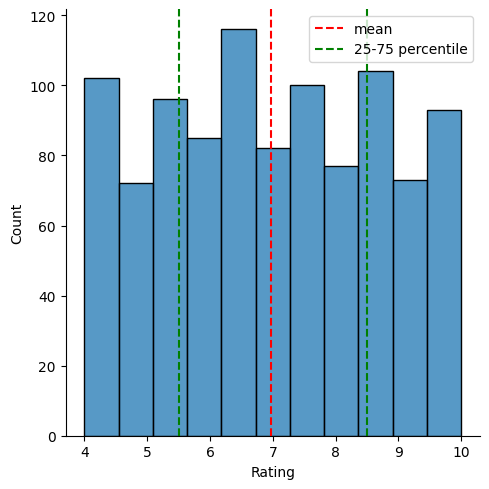

In [ ]:
sns.displot(df['Rating'])
plt.axvline(x=np.mean(df['Rating']), c='red', ls='--', label='mean')
plt.axvline(x=np.percentile(df['Rating'],25),c='green', ls='--', label='25-75 percentile')
plt.axvline(x=np.percentile(df['Rating'],75), c='green', ls='--')
plt.legend()

array([[<Axes: title={'center': 'Unit price'}>,
        <Axes: title={'center': 'Quantity'}>,
        <Axes: title={'center': 'Tax 5%'}>],
       [<Axes: title={'center': 'Total'}>,
        <Axes: title={'center': 'cogs'}>,
        <Axes: title={'center': 'gross margin percentage'}>],
       [<Axes: title={'center': 'gross income'}>,
        <Axes: title={'center': 'Rating'}>, <Axes: >]], dtype=object)

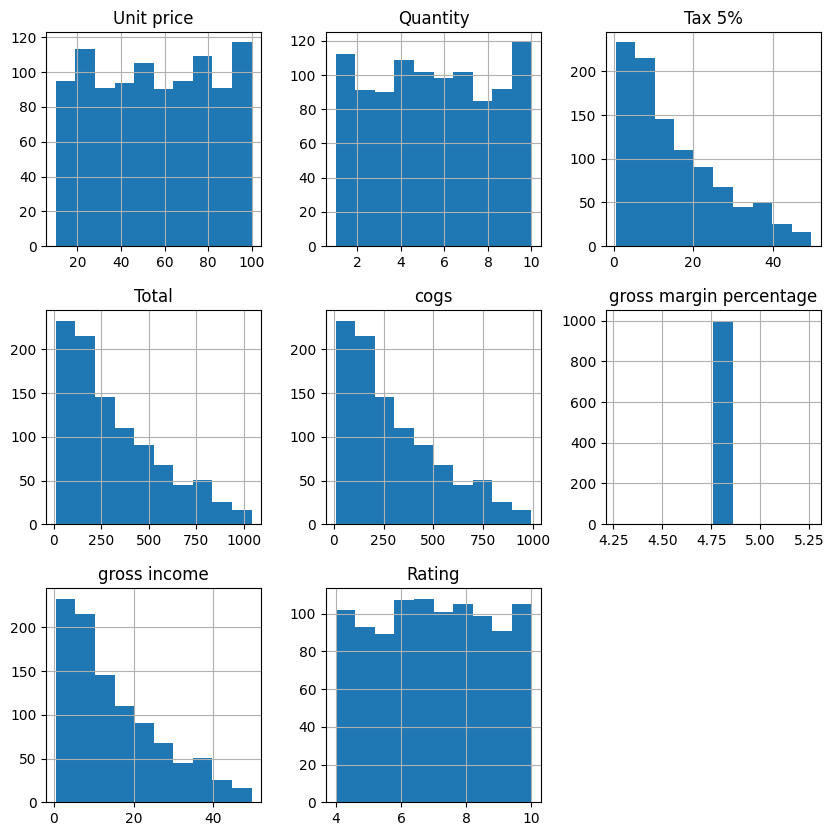

In [ ]:
df.hist(figsize=(10,10))  #gives an histogram for all the columns

<Axes: xlabel='Branch', ylabel='count'>

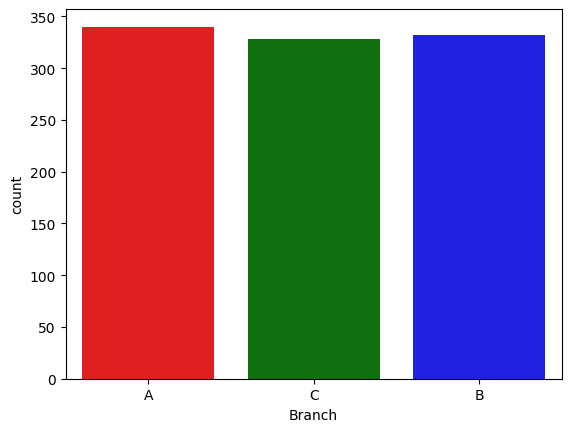

In [ ]:
sns.countplot(x ='Branch', hue="Branch",data=df,palette={'A':'red','B':'Blue','C':'green'})

In [ ]:
df['Branch'].value_counts()

Branch
A    340
B    332
C    328
Name: count, dtype: int64

<Axes: xlabel='Payment', ylabel='count'>

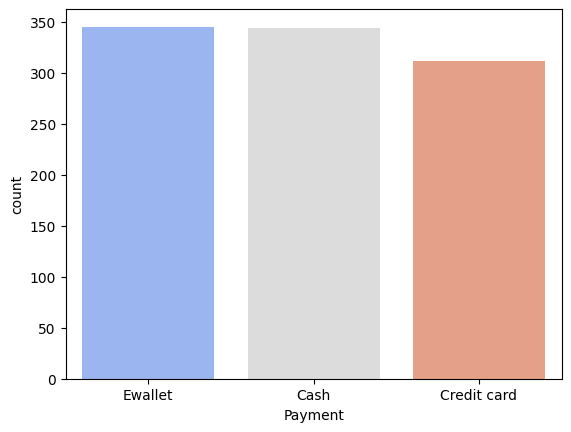

In [ ]:
sns.countplot(x="Payment", data=df, hue="Payment", palette="coolwarm")

<Axes: xlabel='Rating', ylabel='gross income'>

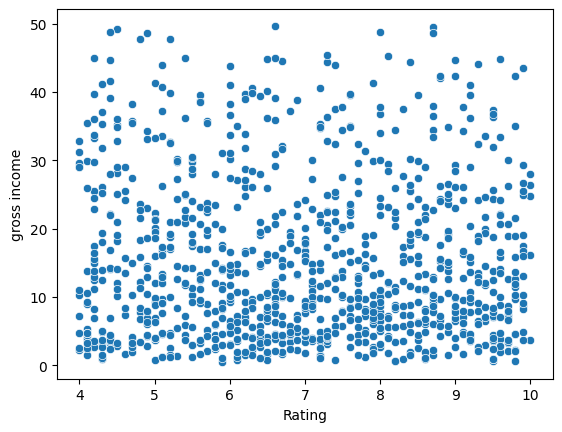

In [ ]:
sns.scatterplot(x=df['Rating'], y=df['gross income'])

<Axes: xlabel='Rating', ylabel='gross income'>

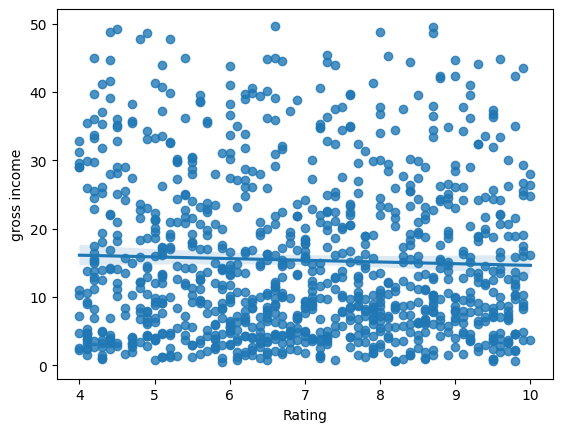

In [ ]:
sns.regplot(x=df['Rating'], y=df['gross income'])

<Axes: xlabel='Branch', ylabel='gross income'>

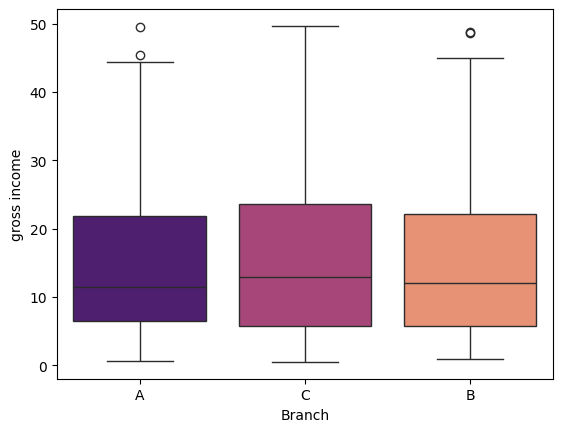

In [ ]:
sns.boxplot(x=df['Branch'], y=df['gross income'], data=df,hue='Branch',palette="magma")

<Axes: xlabel='Gender', ylabel='gross income'>

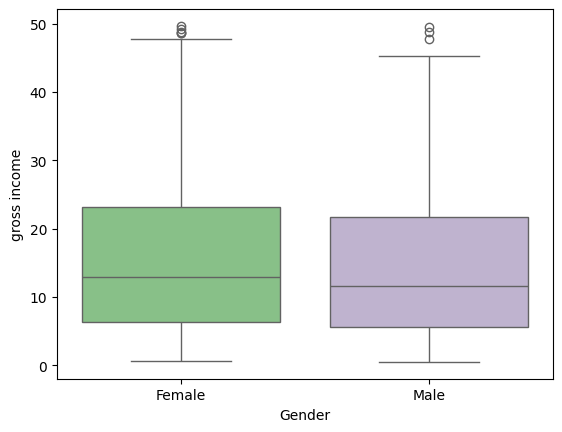

In [ ]:
sns.boxplot(x=df['Gender'], y=df['gross income'], data=df, hue='Gender', palette='Accent')

In [ ]:
df.groupby(df.index).mean(numeric_only=True)

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Date,,,,,,,,
2019-01-01,54.995833,6.750000,18.830083,395.431750,376.601667,4.761905,18.830083,6.583333
2019-01-02,44.635000,6.000000,11.580375,243.187875,231.607500,4.761905,11.580375,6.050000
2019-01-03,59.457500,4.625000,12.369813,259.766062,247.396250,4.761905,12.369813,8.112500
2019-01-04,51.743333,5.333333,12.886417,270.614750,257.728333,4.761905,12.886417,6.516667
2019-01-05,61.636667,4.583333,14.034458,294.723625,280.689167,4.761905,14.034458,7.433333
...,...,...,...,...,...,...,...,...
2019-03-26,42.972308,4.000000,7.188692,150.962538,143.773846,4.761905,7.188692,6.623077
2019-03-27,56.841000,4.500000,13.822950,290.281950,276.459000,4.761905,13.822950,6.760000
2019-03-28,45.525000,4.800000,10.616200,222.940200,212.324000,4.761905,10.616200,7.050000


<Axes: xlabel='Date', ylabel='gross income'>

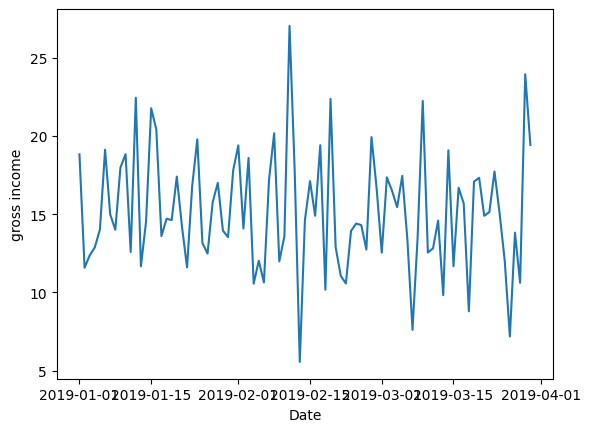

In [ ]:
sns.lineplot(x=df.groupby(df.index).mean(numeric_only=True).index, y=df.groupby(df.index).mean(numeric_only=True)['gross income'])

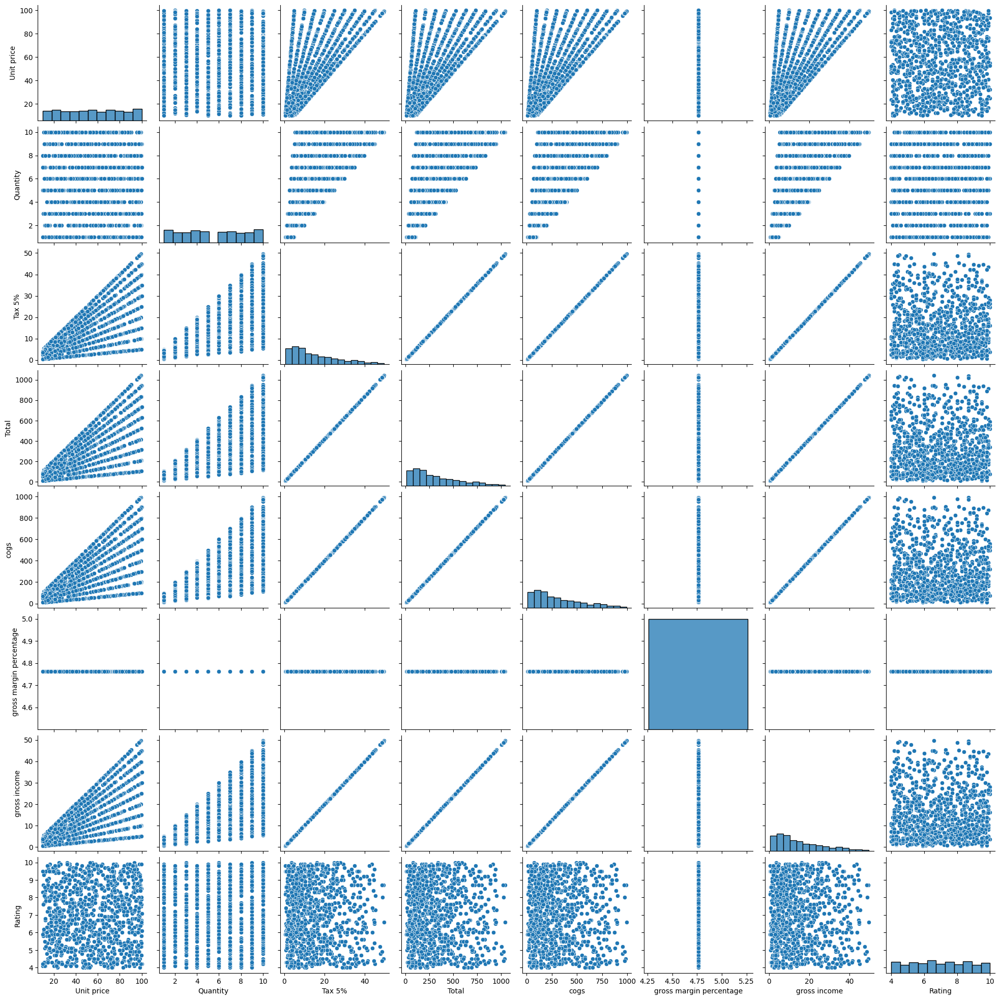

In [ ]:
sns.pairplot(df) #plots all possible plots for a pair for given data

In [ ]:
int(df.duplicated().sum())

0

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.isna().sum()

Invoice ID                 0
Branch                     0
City                       0
Customer type              0
Gender                     0
Product line               0
Unit price                 0
Quantity                   0
Tax 5%                     0
Total                      0
Date                       0
Time                       0
Payment                    0
cogs                       0
gross margin percentage    0
gross income               0
Rating                     0
dtype: int64

In [ ]:
missing_indices = np.random.choice(df.index, size=5, replace=False) # To randomly add missing values
df.loc[missing_indices, "Rating"] = np.nan
print(df.isnull().sum())

Invoice ID                  0
Branch                      0
City                        0
Customer type               0
Gender                      0
Product line                0
Unit price                  0
Quantity                    0
Tax 5%                      0
Total                       0
Time                        0
Payment                     0
cogs                        0
gross margin percentage     0
gross income                0
Rating                     61
dtype: int64


In [ ]:
df.isna().sum()

Invoice ID                  0
Branch                      0
City                        0
Customer type              20
Gender                      0
Product line               20
Unit price                  0
Quantity                   20
Tax 5%                      0
Total                       0
Date                        0
Time                        0
Payment                     0
cogs                        0
gross margin percentage     0
gross income                0
Rating                      0
dtype: int64

In [ ]:
original_df = df.copy()  # Creates a backup of the original data


In [ ]:
df = pd.read_csv("F:\Personal_Notes\power_BI\supermarket\sale.csv")  # Reload original data

In [ ]:
df = df.dropna(subset=["Rating"])  # Remove missing values in "Rating"

In [ ]:
np.random.seed(42)  # Ensure reproducibility
missing_indices = np.random.choice(df.index, size=20, replace=False)

# Assign NaN to the selected columns at the chosen indices
df.loc[missing_indices, ["Customer type", "Product line", "Quantity"]] = np.nan

<Axes: >

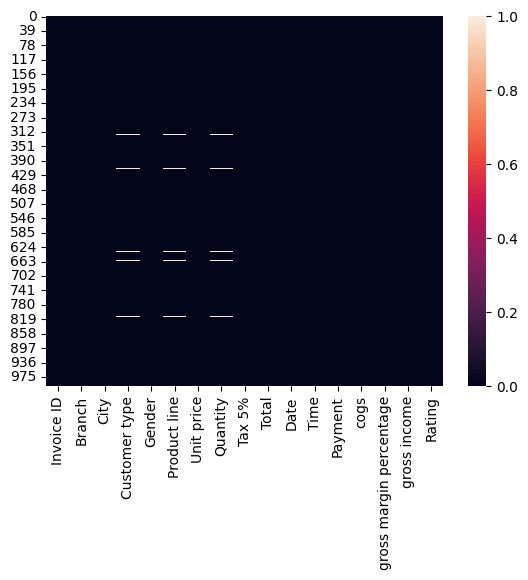

In [ ]:
sns.heatmap(df.isnull())

In [ ]:
df.fillna(df.mean(numeric_only=True), inplace=True)

In [ ]:
df.fillna(df.mode().iloc[0], inplace=True)

<Axes: >

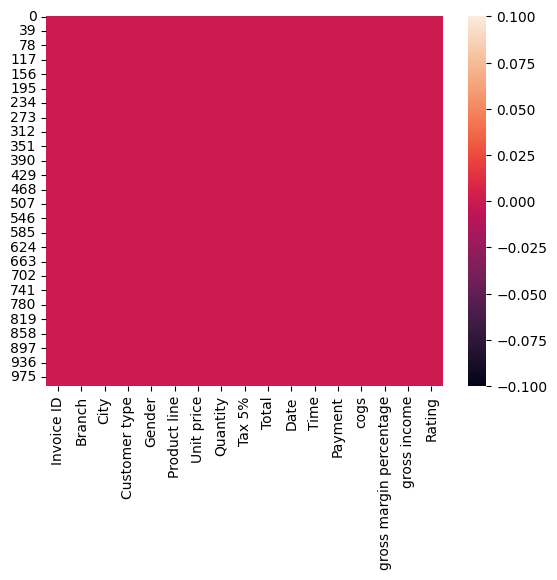

In [ ]:
sns.heatmap(df.isnull())

In [ ]:
dataset = pd.read_csv(r'F:\Personal_Notes\power_BI\supermarket\sale.csv')
prof = ProfileReport(dataset)
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
round(np.corrcoef(dataset['gross income'], dataset['Rating'])[1][0],2)

np.float64(-0.04)

In [ ]:
round(dataset.corr(numeric_only = True),2)

,Unit price,Quantity,Tax 5%,Total,cogs,gross margin percentage,gross income,Rating
Unit price,1.00,0.01,0.63,0.63,0.63,NaN,0.63,-0.01
Quantity,0.01,1.00,0.71,0.71,0.71,NaN,0.71,-0.02
Tax 5%,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
Total,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
cogs,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
gross margin percentage,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gross income,0.63,0.71,1.00,1.00,1.00,NaN,1.00,-0.04
Rating,-0.01,-0.02,-0.04,-0.04,-0.04,NaN,-0.04,1.00


In [ ]:
sns.heatmap(dataset.corr(numeric_only=True))

<Axes: >

In [ ]:
sns.heatmap(round(dataset.corr(numeric_only=True),2), annot=True)

<Axes: >

In [ ]:
corr_matrix = dataset.iloc[:, :50].corr(numeric_only = True)
sns.heatmap(corr_matrix, annot=True)

<Axes: >